### TASK 0: Import of required libraries

In [1]:
# Import necessary libraries
import numpy as np
import pydicom
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib.animation import FuncAnimation, FFMpegWriter

import IPython.display as HTML

### TASK 1: DICOM data
``X_info = pydicom.dcmread(file)`` --> reads the data header \
``X = X_info.pixel_array`` -->  contains the actual image data 


In [2]:
studentPath = "A1__102322_selected/"

studentObjects = ["OAUAL79C", "OAUAL79E", "OAUAL79I", "OAUAL790", "OAUAL792", "OAUAL796"]

X_Info = [pydicom.dcmread(studentPath+s) for s in studentObjects]
X = [x.pixel_array for x in X_Info]

print (X[0].shape)




(720, 960, 3)


### TASK 2: Ultrasound images 


In [5]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

Xgrey = [rgb2gray(x) for x in X]

0.007999999821186066


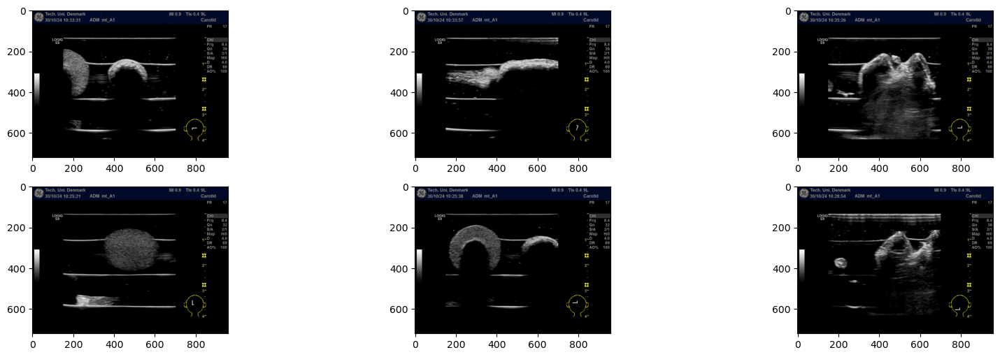

In [6]:

rows = 2
columns = 3
fig = plt.figure(figsize=(20, 6))

for i in range(0, len(X)):
    fig.add_subplot(rows, columns, i+1)
    plt.imshow(X[i])

delta_y = X_Info[5].SequenceOfUltrasoundRegions[0].PhysicalDeltaY  # mm/pixel

print(delta_y)

### TASK 3: A-scan

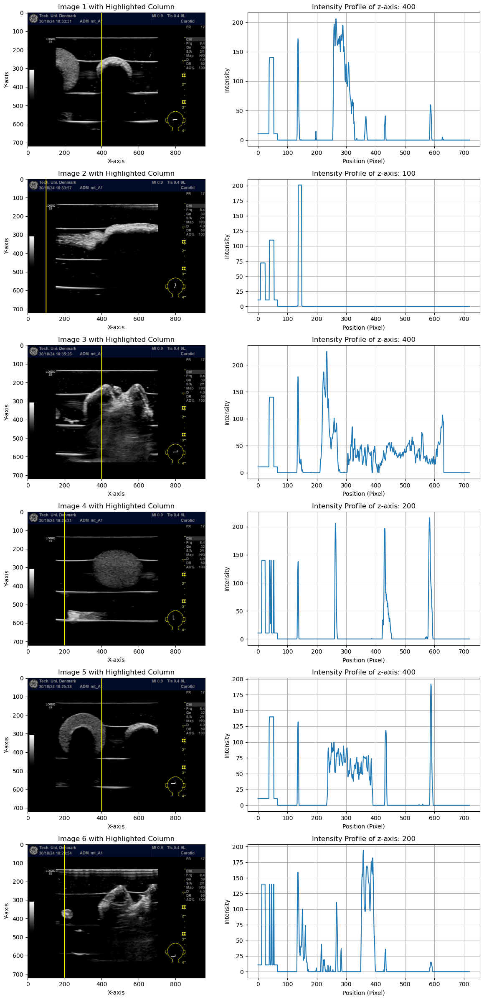

In [7]:
def plot_intensity_profiles(X, Xgrey, xVal, halfThickness=2):
    rows, columns = len(X), 2  # 2 columns: one for the image, one for the profile
    fig = plt.figure(figsize=(12, 4 * len(X)))  # Adjust figure size to fit all plots

    for i in range(len(X)):
        # Highlight the selected column in the RGB image
        Xplot = X[i].copy()
        Xplot[:, range(xVal[i] - halfThickness, xVal[i] + halfThickness), :] = [255, 255, 0]

        # Extract intensity profile from the grayscale image
        intensity_profile = Xgrey[i][:, xVal[i]]

        # Plot the RGB image with highlighted column
        ax1 = fig.add_subplot(rows, columns, 2 * i + 1)
        ax1.imshow(Xplot)
        ax1.set_title(f"Image {i + 1} with Highlighted Column")
        ax1.set_xlabel("X-axis")
        ax1.set_ylabel("Y-axis")

        # Plot intensity profile
        ax2 = fig.add_subplot(rows, columns, 2 * i + 2)
        ax2.plot(range(len(intensity_profile)), intensity_profile)
        ax2.set_xlabel('Position (Pixel)')
        ax2.set_ylabel('Intensity')
        ax2.set_title(f'Intensity Profile of z-axis: {xVal[i]}')
        ax2.grid(True)

    plt.tight_layout()
    plt.show()

# Example usage:
plot_intensity_profiles(X, Xgrey, xVal=[400,100,400,200,400,200], halfThickness=2)


### TASK 4: Signal-to-Noise ratio (SNR)
to create a rectangle \
``plt.Rectangle(xy, width, height)`` \
``plt.gca().add_patch(plt.Rectangle())`` 

In [8]:
def plot_image_with_multiple_rois(Xplot, roi_list):
    fig, ax = plt.subplots(figsize=(5, 4))
    
    # Display the image
    ax.imshow(Xplot, cmap='gray' if Xplot.ndim == 2 else None)
    
    # Add each rectangular ROI
    for roi in roi_list:
        x, y, width, height = roi
        rect = plt.Rectangle((x, y), width, height, linewidth=1, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
    
    # Set titles and labels
    ax.set_title("Image with Multiple ROIs")
    ax.set_xlabel("X-axis")
    ax.set_ylabel("Y-axis")
    plt.grid(False)
    plt.show()

In [9]:
def calculate_snr(Xplot, object_roi, background_roi):
    # Extract object ROI
    x, y, width, height = object_roi
    object_region = Xplot[y:y+height, x:x+width]
    
    # Extract background ROI
    bx, by, bwidth, bheight = background_roi
    background_region = Xplot[by:by+bheight, bx:bx+bwidth]
    
    # Calculate mean of the object signal
    signal_in_object = np.mean(object_region)
    print("Signal in object, mean:", signal_in_object)
    
    # Calculate standard deviation of the background signal
    signal_in_background = np.std(background_region)
    print("Signal in background, std:", signal_in_background)
    
    # Calculate SNR
    snr = signal_in_object / signal_in_background
    return snr

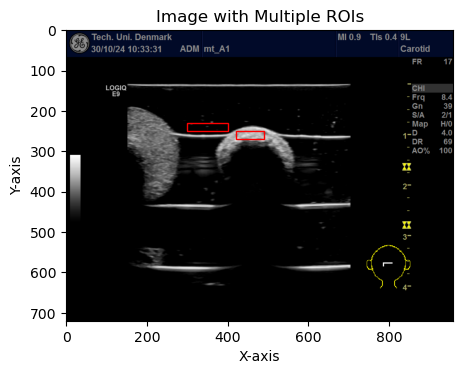

Signal in object, mean: 184.03516607142856
Signal in background, std: 5.101289477998049
SNR: 36.08


In [10]:
roiobj = (420, 250, 70, 20)
roibg = (300, 230,100,20)


plot_image_with_multiple_rois(X[0], [roibg,roiobj])
snr = calculate_snr(Xgrey[0], roiobj, roibg)
print(f"SNR: {snr:.2f}")


### TASK 5: Smoothing
``np.mean()`` \
``np.median()``

In [11]:
def plot_image(Xplot):
    """
    Plots the given image.
    
    Parameters:
        Xplot (ndarray): The image to plot (2D or 3D array).
    """
    plt.figure(figsize=(8, 6))
    plt.imshow(Xplot, cmap='gray' if Xplot.ndim == 2 else None)
    plt.title("Image")
    plt.xlabel("X-axis")
    plt.ylabel("Y-axis")
    plt.grid(False)
    plt.show()

In [12]:

def smoothImageMean(Xplot, kernelSize, numPasses):
    """
    Smooths the input image using a mean filter with the specified kernel size and number of passes.
    
    Parameters:
        Xplot (ndarray): Input image to be smoothed.
        kernelSize (int): Size of the square kernel for mean filtering.
        numPasses (int): Number of times the mean filtering is applied.
    
    Returns:
        ndarray: Smoothed image after applying mean filtering.
    """
    # Initialize the smoothed image
    smoothed_image = Xplot.astype(np.float32)
    
    # Perform smoothing for the specified number of passes
    for _ in range(numPasses):
        # Create a new array for the smoothed result of this pass
        new_smoothed_image = np.zeros_like(smoothed_image, dtype=np.float32)
        
        # Half size of the kernel
        pad = kernelSize // 2
        
        # Iterate over each pixel in the image
        for i in range(smoothed_image.shape[0]):
            for j in range(smoothed_image.shape[1]):
                # Define the window boundaries
                x_start = max(i - pad, 0)
                x_end = min(i + pad + 1, smoothed_image.shape[0])
                y_start = max(j - pad, 0)
                y_end = min(j + pad + 1, smoothed_image.shape[1])
                
                # Extract the local window
                local_window = smoothed_image[x_start:x_end, y_start:y_end]
                
                # Compute the mean of the local window
                new_smoothed_image[i, j] = np.mean(local_window)
        
        # Update the smoothed image for the next pass
        smoothed_image = new_smoothed_image
    
    return smoothed_image


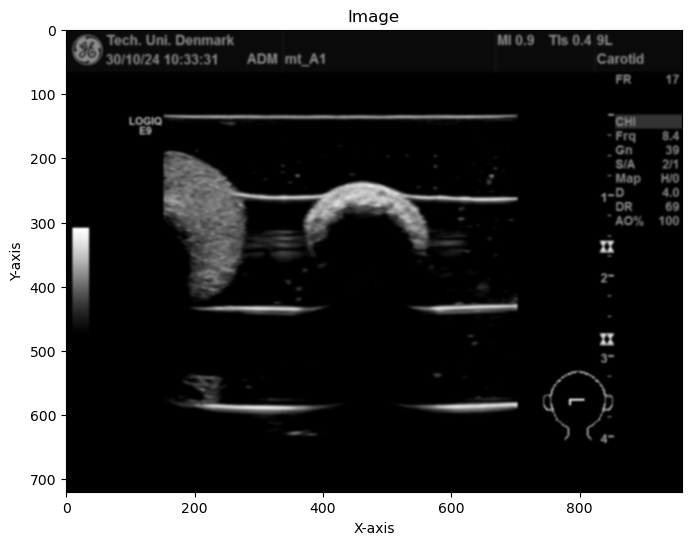

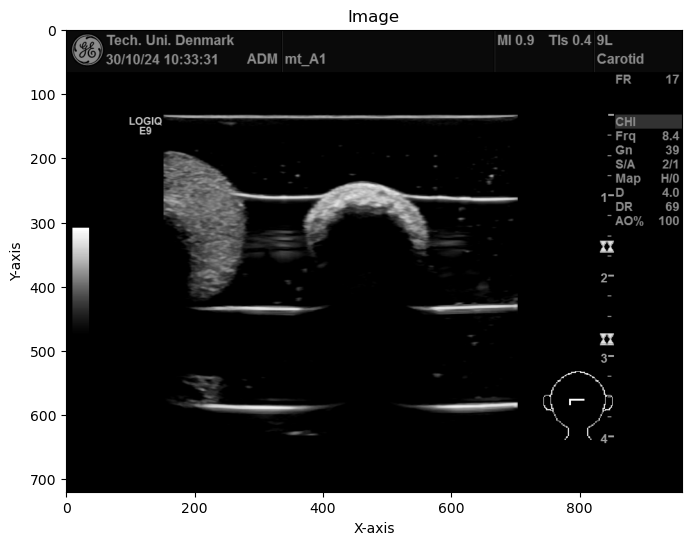

In [13]:
XSmooth = smoothImageMean(Xgrey[0], 3,3)
plot_image(XSmooth)
plot_image(Xgrey[0])


### TASK 6: Scalebar

In [14]:
def create_scalebar(ax, X_info, x_position, y_position, scalebar_length_mm=1, 
                    orientation='vertical', color='white', linewidth=2, fontsize=10):
    """
    Adds a scalebar to an existing plot.

    Parameters:
    - ax: Matplotlib axis object to add the scalebar to.
    - X_info: DICOM metadata object containing physical delta information.
    - x_position: X-coordinate for the scalebar's start position in pixels.
    - y_position: Y-coordinate for the scalebar's start position in pixels.
    - scalebar_length_mm: Length of the scalebar in millimeters.
    - orientation: 'vertical' or 'horizontal' for the scalebar orientation.
    - color: Color of the scalebar.
    - linewidth: Thickness of the scalebar.
    - fontsize: Font size for the scalebar label.
    """
    # Extract physical pixel size from the DICOM header
    physical_delta_y = X_info.SequenceOfUltrasoundRegions[0].PhysicalDeltaY  # mm/pixel
    physical_delta_x = X_info.SequenceOfUltrasoundRegions[0].PhysicalDeltaX  # mm/pixel

    # Calculate scalebar length in pixels based on orientation
    if orientation == 'vertical':
        scalebar_length_pixels = scalebar_length_mm / physical_delta_y
    elif orientation == 'horizontal':
        scalebar_length_pixels = scalebar_length_mm / physical_delta_x
    else:
        raise ValueError("Orientation must be 'vertical' or 'horizontal'.")

    # Calculate start and end points for the scalebar
    if orientation == 'vertical':
        start_x, end_x = x_position, x_position
        start_y, end_y = y_position, y_position - scalebar_length_pixels
    else:  # Horizontal
        start_x, end_x = x_position, x_position + scalebar_length_pixels
        start_y, end_y = y_position, y_position

    # Add the scalebar
    ax.plot([start_x, end_x], [start_y, end_y], color=color, linewidth=linewidth)

    # Add a label for the scalebar
    if orientation == 'vertical':
        label_x, label_y = start_x + 10, start_y+10
        alignment = 'center'
    else:  # Horizontal
        label_x, label_y = end_x+10, start_y + 10
        alignment = 'center'

    ax.text(label_x, label_y, f"{scalebar_length_mm} cm", color=color,
            verticalalignment=alignment, fontsize=fontsize,
            bbox=dict(facecolor='black', alpha=0.5))


def plot_with_scalebars(Xplot, X_info, scalebars, title="set title"):
    
    # Get image dimensions
    image_height, image_width = Xplot.shape

    # Plot the image
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.imshow(Xplot, cmap='gray', aspect='auto')
    ax.set_xlim(0, image_width)
    ax.set_ylim(image_height, 0)  # Flip the y-axis for correct orientation

    # Add each scalebar
    for scalebar in scalebars:
        create_scalebar(
            ax,
            X_info,
            x_position=scalebar['x_position'],
            y_position=scalebar['y_position'],
            scalebar_length_mm=scalebar.get('scalebar_length_mm', 1),
            orientation=scalebar.get('orientation', 'vertical'),
            color=scalebar.get('color', 'white'),
            linewidth=scalebar.get('linewidth', 2),
            fontsize=scalebar.get('fontsize', 10)
        )

    # Add axis labels and title
    ax.set_xlabel("X-axis (pixels)")
    ax.set_ylabel("Y-axis (pixels)")
    ax.set_title(title)
    plt.grid(False)
    plt.show()




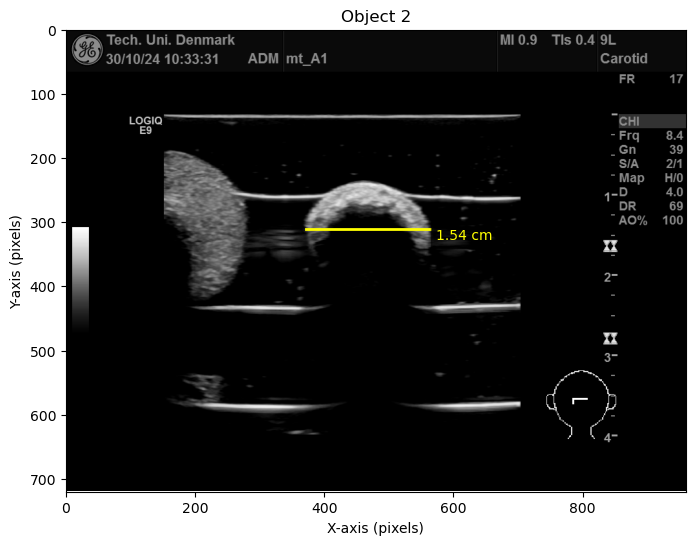

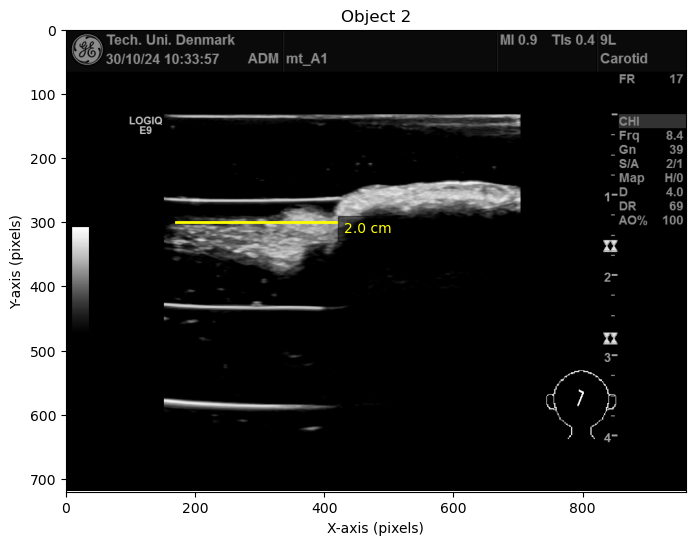

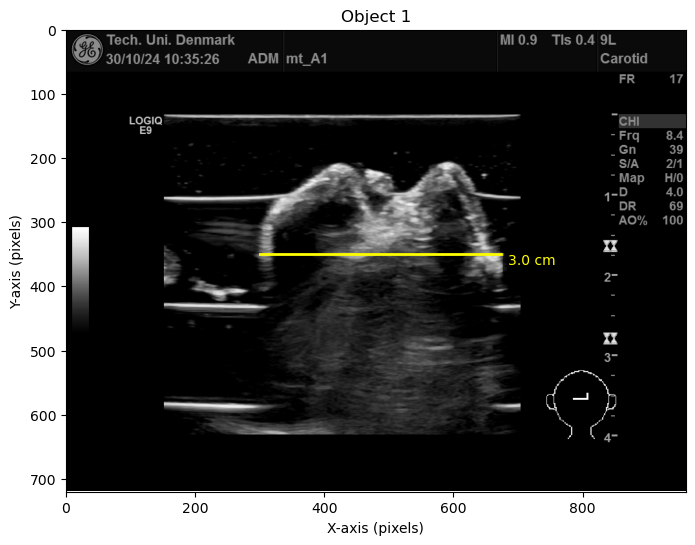

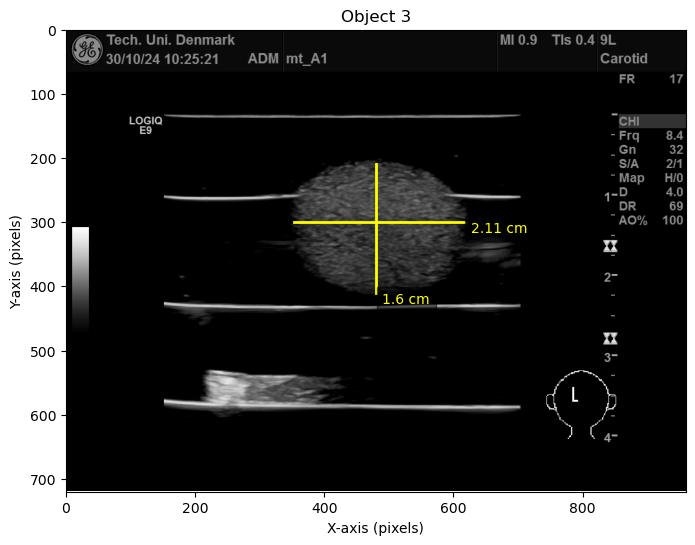

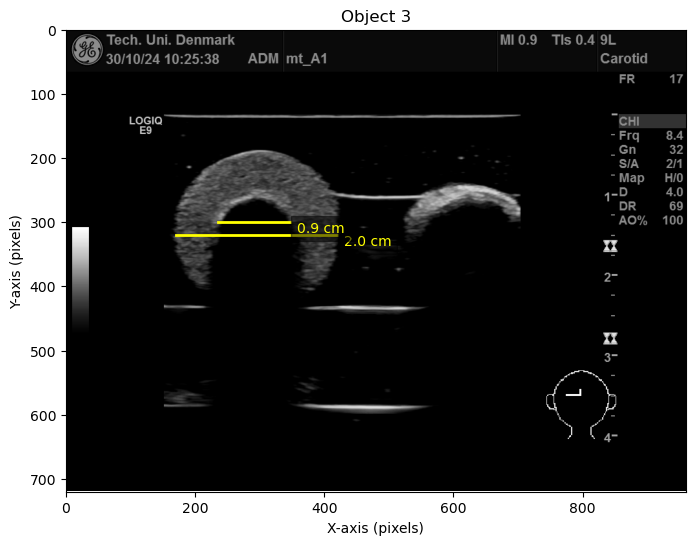

In [35]:
def plotX0():
    # Example usage:
    scalebars = [
        {'x_position': 371, 'y_position': 310, 'scalebar_length_mm': 1.54, 'orientation': 'horizontal', 'color': 'yellow'}
    ]
    plot_with_scalebars(Xgrey[0], X_Info[0], scalebars, title="Object 2")

def plotX1():
    # Example usage:
    scalebars = [
        {'x_position': 170, 'y_position': 300, 'scalebar_length_mm': 2.0, 'orientation': 'horizontal', 'color': 'yellow'},
    ]
    plot_with_scalebars(Xgrey[1], X_Info[1], scalebars, title="Object 2")


def plotX2():
    # Example usage:
    scalebars = [
        {'x_position': 300, 'y_position': 350, 'scalebar_length_mm': 3.0, 'orientation': 'horizontal', 'color': 'yellow'}
    ]
    plot_with_scalebars(Xgrey[2], X_Info[2], scalebars, title="Object 1")

def plotX3():
    # Example usage:
    scalebars = [
        {'x_position': 353, 'y_position': 300, 'scalebar_length_mm': 2.11, 'orientation': 'horizontal', 'color': 'yellow'},
        {'x_position': 480, 'y_position': 410, 'scalebar_length_mm': 1.6, 'orientation': 'vertical', 'color': 'yellow'}
    ]
    plot_with_scalebars(Xgrey[3], X_Info[3], scalebars, title="Object 3")

def plotX4():
    # Example usage:
    scalebars = [
        {'x_position': 170, 'y_position': 320, 'scalebar_length_mm': 2.0, 'orientation': 'horizontal', 'color': 'yellow'},
        {'x_position': 235, 'y_position': 300, 'scalebar_length_mm': 0.9, 'orientation': 'horizontal', 'color': 'yellow'},

    ]
    plot_with_scalebars(Xgrey[4], X_Info[4], scalebars, title="Object 3")

plotX0()
plotX1()
plotX2()
plotX3()
plotX4()

In [16]:
# Info:
dicom_obj = X_Info[0]

print("--- Information for DICOM Object ---\n")
# Loop through all elements in X_Info[0]
for elem in X_Info[0]:
    if elem.VR == 'SQ':  # Sequence of items
        print(f"Sequence: {elem.keyword}")
        for item in elem.value:
            print("\tItem:")
            for sub_elem in item:
                print(f"\t{sub_elem.tag} {sub_elem.keyword}: {sub_elem.value}")
    else:
        print(f"{elem.tag} {elem.keyword}: {elem.value}")

--- Information for DICOM Object ---

(0008, 0008) ImageType: ['ORIGINAL', 'PRIMARY', 'VASCULAR', '0001', 'GEMSSINGLEFRAME', 'GEMSMGCOUNT1']
(0008, 0016) SOPClassUID: 1.2.840.10008.5.1.4.1.1.6.1
(0008, 0018) SOPInstanceUID: 1.2.840.113619.2.256.50121011638.1730280816.29
(0008, 0020) StudyDate: 20241030
(0008, 0021) SeriesDate: 20241030
(0008, 0023) ContentDate: 20241030
(0008, 0030) StudyTime: 102322
(0008, 0031) SeriesTime: 102322
(0008, 0033) ContentTime: 103336
(0008, 0050) AccessionNumber: 
(0008, 0060) Modality: US
(0008, 0070) Manufacturer: GE Healthcare
(0008, 0080) InstitutionName: Tech. Uni. Denmark
(0008, 0090) ReferringPhysicianName: 
(0008, 1010) StationName: LOGIQE9
(0008, 1040) InstitutionalDepartmentName: CFU
(0008, 1070) OperatorsName: ADM
(0008, 1090) ManufacturerModelName: LOGIQE9
(0010, 0010) PatientName: 
(0010, 0020) PatientID: mt_A1
(0010, 0030) PatientBirthDate: 
(0010, 0032) PatientBirthTime: 000000
(0010, 0040) PatientSex: O
(0018, 1020) SoftwareVersions: LOGIQ

In [17]:
# Assuming X_Info[0] is the DICOM object
dicom_obj = X_Info[0]

# Define frequency-related tags as hexadecimal
frequency_tags = {
    'NominalFrequency': (0x0018, 0x0084),
    'PulseRepetitionFrequency': (0x0018, 0x1202),
}

print("--- Frequency Information ---")
for keyword, tag in frequency_tags.items():
    if tag in dicom_obj:
        print(f"{keyword}: {dicom_obj[tag].value}")
    else:
        print(f"{keyword}: Not found in the DICOM file")

--- Frequency Information ---
NominalFrequency: Not found in the DICOM file
PulseRepetitionFrequency: Not found in the DICOM file


In [18]:
dicom_obj = X_Info[0]

# Check for the SequenceOfUltrasoundRegions
if hasattr(dicom_obj, "SequenceOfUltrasoundRegions"):
    print("\n--- SequenceOfUltrasoundRegions ---\n")
    for idx, region in enumerate(dicom_obj.SequenceOfUltrasoundRegions):
        print(f"Region {idx + 1}:")
        for elem in region:
            print(f"  {elem.tag} {elem.keyword}: {elem.value}")
else:
    print("SequenceOfUltrasoundRegions not found in this DICOM object.")


--- SequenceOfUltrasoundRegions ---

Region 1:
  (0018, 6012) RegionSpatialFormat: 1
  (0018, 6014) RegionDataType: 1
  (0018, 6016) RegionFlags: 0
  (0018, 6018) RegionLocationMinX0: 2
  (0018, 601a) RegionLocationMinY0: 133
  (0018, 601c) RegionLocationMaxX1: 853
  (0018, 601e) RegionLocationMaxY1: 632
  (0018, 6020) ReferencePixelX0: 426
  (0018, 6022) ReferencePixelY0: -64
  (0018, 6024) PhysicalUnitsXDirection: 3
  (0018, 6026) PhysicalUnitsYDirection: 3
  (0018, 6028) ReferencePixelPhysicalValueX: 0.0
  (0018, 602a) ReferencePixelPhysicalValueY: 0.0
  (0018, 602c) PhysicalDeltaX: 0.007999999821186066
  (0018, 602e) PhysicalDeltaY: 0.007999999821186066
  (0018, 6030) TransducerFrequency: 8400


In [19]:
import pydicom

def print_dicom_data(dicom_element, indent=0):
    """
    Recursively prints all DICOM elements, including private tags and nested sequences.
    """
    if hasattr(dicom_element, "tag"):
        indent_str = "  " * indent
        try:
            # Check if the element is a sequence
            if dicom_element.VR == "SQ":
                print(f"{indent_str}{dicom_element.tag} {dicom_element.keyword}: (Sequence with {len(dicom_element.value)} items)")
                for i, item in enumerate(dicom_element.value):
                    print(f"{indent_str}  Item {i + 1}:")
                    for sub_elem in item:
                        print_dicom_data(sub_elem, indent + 2)
            else:
                # Print normal DICOM data elements
                value = dicom_element.value
                print(f"{indent_str}{dicom_element.tag} {dicom_element.keyword}: {value}")
        except Exception as e:
            print(f"{indent_str}{dicom_element.tag} {dicom_element.keyword}: (Could not display: {e})")
    else:
        # Handle cases where the item does not have a tag
        print(" " * indent, dicom_element)

# Load the first DICOM file from your X_Info
dicom_obj = X_Info[0]

# Iterate through all elements, focusing on private tags
print("\n--- Private Tags ---\n")
for elem in dicom_obj:
    if elem.tag.group > 0x7FE0:  # Private tags typically have groups > 0x7FE0
        print_dicom_data(elem)



--- Private Tags ---

(7fe1, 0010) : GEMS_Ultrasound_MovieGroup_001
(7fe1, 1001) : (Sequence with 1 items)
  Item 1:
    (7fe1, 0010) : GEMS_Ultrasound_MovieGroup_001
    (7fe1, 1002) : 2D+2D+2D
    (7fe1, 1003) : 1000
    (7fe1, 1008) : (Sequence with 80 items)
      Item 1:
        (7fe1, 0010) : GEMS_Ultrasound_MovieGroup_001
        (7fe1, 1048) : 1.0
        (7fe1, 1057) : Carotid
      Item 2:
        (7fe1, 0010) : GEMS_Ultrasound_MovieGroup_001
        (7fe1, 1048) : 2.0
        (7fe1, 1052) : 1540.0
      Item 3:
        (7fe1, 0010) : GEMS_Ultrasound_MovieGroup_001
        (7fe1, 1048) : 3.0
        (7fe1, 1054) : 1540
      Item 4:
        (7fe1, 0010) : GEMS_Ultrasound_MovieGroup_001
        (7fe1, 1048) : 4.0
        (7fe1, 1052) : 71.97955283477177
      Item 5:
        (7fe1, 0010) : GEMS_Ultrasound_MovieGroup_001
        (7fe1, 1048) : 5.0
        (7fe1, 1052) : -9.9e+22
      Item 6:
        (7fe1, 0010) : GEMS_Ultrasound_MovieGroup_001
        (7fe1, 1048) : 6.0
    

In [20]:
# Extract all gain-related tags
gain_data = []

for elem in X_Info[0]:
    if elem.VR == "SQ":  # If it's a sequence
        for item in elem.value:
            for sub_elem in item:
                if "gain" in str(sub_elem.value).lower():
                    gain_data.append((sub_elem.tag, sub_elem.keyword, sub_elem.value))

# Display gain-related information
for tag, keyword, value in gain_data:
    print(f"{tag} {keyword}: {value}")

(7fe1, 1070) : [(7fe1, 0010) Private Creator                     LO: 'GEMS_Ultrasound_MovieGroup_001'
(7fe1, 1071) [Unknown]                           UL: 173
(7fe1, 1072) [Unknown]                           LO: '#AOAvailable'(7fe1, 0010) Private Creator                     LO: 'GEMS_Ultrasound_MovieGroup_001'
(7fe1, 1071) [Unknown]                           UL: 174
(7fe1, 1072) [Unknown]                           LO: '#AcqGain'(7fe1, 0010) Private Creator                     LO: 'GEMS_Ultrasound_MovieGroup_001'
(7fe1, 1071) [Unknown]                           UL: 175
(7fe1, 1072) [Unknown]                           LO: '#ActiveSimplexMovie'(7fe1, 0010) Private Creator                     LO: 'GEMS_Ultrasound_MovieGroup_001'
(7fe1, 1071) [Unknown]                           UL: 100
(7fe1, 1072) [Unknown]                           LO: '#AdditionalEdgeEnhance'(7fe1, 0010) Private Creator                     LO: 'GEMS_Ultrasound_MovieGroup_001'
(7fe1, 1071) [Unknown]                       

In [6]:
# Volume of object 3

import numpy as np

# Original dimensions and scale
dim = np.array([2.11, 1.6, 2.0])  # diameters


# Calculate semi-diameters (radii)
radii = dim / 2

# Formula for volume of an ellipsoid: V = (4/3) * π * a * b * c
volume = (4 / 3) * np.pi * radii[0] * radii[1] * radii[2]

print(f"Volume of the ellipsoid: {volume:.2f} cm³")

Volume of the ellipsoid: 3.54 cm³
